<h1 style="text-align: center;"> Analísis de datos en SofaScore </h1>
<h1 style="text-align: right; font-size: 24px; margin-right: 10px;"> Guillermo Díaz Aguado </h1>


# 1. Introducción.
Actualmente los juegos "Fútbol Fantasy"/"Comunio" se han vuelto muy virales, estas aplicaciones están en todos los móviles de los aficionados al fútbol. Se basan en crear un equipo con jugadores de las grandes ligas y dependiendo del rendimiento de estos jugadores en sus partidos, recibirás una puntuación. Uno de los métodos de puntuación viene dado por las estadísticas de <span style="color:cyan">SofaScore</span>. <p>
El trabajo actual se basará en entender como funciona el formato e intentar encontrar los apartados mejores puntuados y qué jugadores serían los mejores para fichar.

In [286]:
import os
import numpy as np
from botasaurus.request import request, Request
from botasaurus_requests.response import Response
import json
from typing import Union, Sequence
from pprint import pprint
from pymongo import MongoClient
from IPython.display import display, JSON
import matplotlib.pyplot as plt
from scipy.stats import norm

# 2. Scrapear datos

Lo primero que necesitaremos para analizar los datos será extraer los datos de los partidos y de los jugadores de la liga que utilizaremos de referencia. Como tenemos en nuestro país una de las ligas más importantes (por no decir la más importante), utilizaremos dicho torneo español llamado <span style="color:brown">La Liga</span> y debido a que mi ordenador no es de los más potentes, utilizaremos los datos de la temporada actual, la temporada 24/25 que no lleva una gran cantidad de partidos pero en mi opinion si que son suficientes. 

<p>

Para scrapear los datos he utilizado parte del código presentado por **oseymour** en su Github https://github.com/oseymour/ScraperFC

<p>

A continuación se presentan algunos datos iniciales para poder scrapear los datos de la API de <span style="color:cyan">SofaScore</span>.
* Inicio de la URL para acceder a la API de <span style="color:cyan">SofaScore</span>.
* Id de <span style="color:brown">La Liga</span>.
* Id de la temporada.
* Campos usados para calcular la puntuación.
* Competiciones disponibles en la API y su respectivo identifcador.

In [287]:
API_PREFIX = 'https://api.sofascore.com/api/v1'
league_id = "8" # Identificador de Laliga
season_id = "61643"


LEAGUE_STATS_FIELDS = [
    'goals', 'yellowCards', 'redCards', 'groundDuelsWon', 'groundDuelsWonPercentage',
    'aerialDuelsWon', 'aerialDuelsWonPercentage', 'successfulDribbles',
    'successfulDribblesPercentage', 'tackles', 'assists', 'accuratePassesPercentage',
    'totalDuelsWon', 'totalDuelsWonPercentage', 'minutesPlayed', 'wasFouled', 'fouls',
    'dispossessed', 'possesionLost', 'appearances', 'started', 'saves', 'cleanSheets',
    'savedShotsFromInsideTheBox', 'savedShotsFromOutsideTheBox',
    'goalsConcededInsideTheBox', 'goalsConcededOutsideTheBox', 'highClaims',
    'successfulRunsOut', 'punches', 'runsOut', 'accurateFinalThirdPasses',
    'bigChancesCreated', 'accuratePasses', 'keyPasses', 'accurateCrosses',
    'accurateCrossesPercentage', 'accurateLongBalls', 'accurateLongBallsPercentage',
    'interceptions', 'clearances', 'dribbledPast', 'bigChancesMissed', 'totalShots',
    'shotsOnTarget', 'blockedShots', 'goalConversionPercentage', 'hitWoodwork', 'offsides',
    'expectedGoals', 'errorLeadToGoal', 'errorLeadToShot', 'passToAssist'
]
concatenated_fields = '%2C'.join(LEAGUE_STATS_FIELDS)

comps = {
    # European continental club comps
    'Champions League': 7, 'Europa League': 679, 'Europa Conference League': 17015,
    # European domestic leagues
    'EPL': 17, 'La Liga': 8, 'Bundesliga': 35, 'Serie A': 23, 'Ligue 1': 34,
    # South America
    'Argentina Liga Profesional': 155, 'Argentina Copa de la Liga Profesional': 13475,
    'Liga 1 Peru': 406, "Copa Libertadores": 384,
    # USA
    'MLS': 242, 'USL Championship': 13363, 'USL1': 13362, 'USL2': 13546,
    # Middle East
    "Saudi Pro League": 955,
    # Men's international comps
    'World Cup': 16, 'Euros': 1, 'Gold Cup': 140,
    # Women's international comps
    "Women's World Cup": 290
}

Es momento de empezar a pensar que vamos a necesitar para analizar el rendimiento de todos los jugadores. Para tener una visión general del funcionamiento del algorítmo de <span style="color:cyan">SofaScore</span> voy a tener en cuenta los siguientes valores. Esta lista está ordenada según el peso que pienso que puede llegar a tener cada campo en la puntuación individual de los jugadores.
1. Rendimiento individual del jugador en cada partido.
2. Minutos jugados por cada jugador en cada partido.
    * Solo tendremos en cuenta los jugadores que hayan jugado más de 90 min en el partido evaluado.
3. Rendimiento grupal del equipo del jugador en ese partido.
    * Parece ser que si un equipo gana el partido, dicho jugador recibirá mas puntos.


Empezaremos scrapeando los datos de todos los partidos de esta temporada, para después guardarlos en nuestra base de datos. Como veremos en unos pasos, la mayoría de los datos recibidos por <span style="color:cyan">SofaScore</span> son irrelevantes, así que será mejor modificar está colección y generar una colección refinada con los datos más relevantes.

## Scrapear datos de todos los partidos.
Todas las funciones presentadas en este trabajo para scrapear datos de la API tienen una fuerte influencia en el código de **oseymour**, pero además he hecho alguna modificación para quitar las partes innecesarias para mi proyecto y añadir otras partes. 

La siguiente función se encarga de que la URL proporcionada sea correcta y nos devuelve los datos de esta "request".

In [288]:
@request(output=None, create_error_logs=False)
def botasaurus_get(req: Request, url: str) -> Response:
    """ General purpose "get" function that uses Botasaurus.
    
    Parameters
    ----------
    req : botasaurus.request.Request
        The request object provided by the botasaurus decorator
    url : str
        The URL to request
        
    Returns
    -------
    botasaurus_requests.response.Response
        The response from the request
    """
    if not isinstance(url, str):
        raise TypeError('`url` must be a string.')
    resp = req.get(url)
    return resp

In [289]:
def get_valid_seasons(league: str) -> dict:
    """ Returns the valid seasons and their IDs for the given league

    Parameters
    ----------
    league : str
        League to get valid seasons for. See comps ScraperFC.Sofascore for valid leagues.
    
    Returns
    -------
    seasons : dict
        Available seasons for the league. {season string: season ID, ...}
    """
    #if not isinstance(league, str):
    #    raise TypeError('`league` must be a string.')
    #if league not in comps.keys():
    #    raise InvalidLeagueException(league, 'Sofascore', list(comps.keys()))
        
    response = botasaurus_get(f'{API_PREFIX}/unique-tournament/{comps[league]}/seasons/')
    seasons = dict([(x['year'], x['id']) for x in response.json()['seasons']])
    return seasons

In [290]:
def get_match_dicts(year: str, league:str) -> Sequence[dict]:
    """ Returns the matches from the Sofascore API for a given league season.

    Parameters
    ----------
    year : str
        See the :ref:`sofascore_year` `year` parameter docs for details.
    league : str
        League to get valid seasons for. See comps ScraperFC.Sofascore for valid leagues.
    
    Returns
    -------
    matches : list of dict
        Each element being a single game of the competition
    """
    valid_seasons = get_valid_seasons(league)

    matches = list()
    i = 0
    while 1:
        response = botasaurus_get(
            f'{API_PREFIX}/unique-tournament/{comps[league]}/season/{valid_seasons[year]}/' +
            f'events/last/{i}'
        )
        if response.status_code != 200:
            break
        matches += response.json()['events']
        i += 1

    return matches

In [291]:
partidos_en_temporada = get_match_dicts("24/25", "La Liga")

print(json.dumps(partidos_en_temporada, indent=4))

[
    {
        "tournament": {
            "name": "LaLiga",
            "slug": "laliga",
            "category": {
                "name": "Spain",
                "slug": "spain",
                "sport": {
                    "name": "Football",
                    "slug": "football",
                    "id": 1
                },
                "id": 32,
                "country": {
                    "alpha2": "ES",
                    "alpha3": "ESP",
                    "name": "Spain",
                    "slug": "spain"
                },
                "flag": "spain",
                "alpha2": "ES"
            },
            "uniqueTournament": {
                "name": "LaLiga",
                "slug": "laliga",
                "primaryColorHex": "#2f4a89",
                "secondaryColorHex": "#f4a32e",
                "category": {
                    "name": "Spain",
                    "slug": "spain",
                    "sport": {
                        "name": 

Acabamos de scrappear los datos básicos de todos los partidos de la temporada que se encuentran utilizando la API de SofaScore.
<p>
El siguiente paso es guardarlos como una nueva collección en una base de datos.

In [292]:
cliente = MongoClient()  # Cambia la URL si es necesario, yo la dejo así porque solo tengo una 
db = cliente["SofaScore"]  # Nombre de la base de datos
partidos_db = db["Partidos"]

if not partidos_db.count_documents({})>0:  # Añado este condicional para que cada vez que en las pruebas, 
                                           # yo ejecute el programa no se añadan los datos
    partidos_db.insert_many(partidos_en_temporada)

## Refinado de la colección de los datos de todos los partidos.


Un detalle a tener en cuenta en nuestro analísis es cuantos partidos tenemos guardados, para ello se podría hacer de dos maneras: 
1. Contando cuantos documentos tenemos en nuestra collección.
2. Saber cuantas jornadas hay y multiplicar por partidos por jornada.
    + Una jornada es una ronda completa de partidos
<p>
Empezaremos contando el número de documentos que tenemos en nuestra base de datos


In [293]:
partidos_db.count_documents({})

159

In [294]:
resultado = partidos_db.aggregate([
    {
        "$group": {
            "_id": None,
            "maxValor": { "$max": "$roundInfo.round" } 
        }
    }
])


for doc in resultado:
    print(doc)

{'_id': None, 'maxValor': 19}


Nos da la jornada 19 como última jornada, pero actualmente la última jornada disputada es la 17, ¿Como es esto posible?. En verdad, el resultado que nos da es correcto, puesto que para la jornada 19 se adelantaron 2 partidos, pero son únicamente 2 partidos, con lo que no tiene sentido lo siguiente: 

$$numero\_partidos\_jornada * jornada\_19$$ 

Por ello vamos ha hacer que nuestro *aggregate* no tenga en cuenta los documentos con *jornada: 19*.

In [295]:
resultado = partidos_db.aggregate([
    {
        "$match": { "roundInfo.round": { "$ne": 19 } }
    },
    {
        "$group": {
            "_id": None,
            "maxValor": { "$max": "$roundInfo.round" }
        }
    }
])

for doc in resultado:
    print(doc)

{'_id': None, 'maxValor': 16}


Ahora nos sale algo coherente: 
$$17_{(jornadas)} * 10_{partidos\_jornada} + 2_{partidos adelantados} = 172$$ 
Pero existe una cosa, que no he contado, y es que por motivo de la DANA hubo unos cuantos partidos del valencia que no se han jugado aún y que tiene fecha muy proxima, por lo que deberiamos eliminar los documentos de los partidos aun no disputados. En el momento de escritura de este apartado(10/12/24), se tiene bien claro que el partido que se va a quedar aplazado va a ser el Valencia - Real Madrid, pero la semana de entrega del proyecto se jugarán algún partido de los aplazados.

In [296]:
resultado = partidos_db.find({"status.description": { "$ne": "Ended" }}, {"slug"})

for doc in resultado:
    print(doc)

Como estos partidos no se han jugado, no tiene sentido tenerlos (aún) en la base de datos, por que lo optimo sería eliminarlos

In [297]:
partidos_db.delete_many({"status.description": { "$ne": "Ended" }})

DeleteResult({'n': 0, 'ok': 1.0}, acknowledged=True)

Verificamos que se han borrado los documentos de los partidos que aún no se han disputado y volvemos a contar los partidos que tenemos en nuestra base de datos. Finalmente nos debería dar el número correcto de partidos que vayamos a usar

In [298]:
resultado = partidos_db.find({"status.description": { "$ne": "Ended" }}, {"slug"})

for doc in resultado:
    print(doc)

In [299]:
partidos_db.count_documents({})

159

Con estos datos sacados de la web podemos ver que hay bastantes elementos innecesarios para nuestra investigación. He decidido que los más relevantes para nuestro analísis de datos van a ser los siguientes:
* **id**: id del partido 
* **round**: int que especifica la jornada
* **teams**: documento con datos de los equipos
* **score**: documento con datos del resultado


Por ello vamos a crear una nueva colección con solo estos datos de nuestros documentos. 
Vamos a hacer unos cambios para que sea más fácil de leer y solo tengan los datos que nos interesen:
1. La jornada o **round** no este embebida en un documento.
2. El apartado de **teams** será un documento con los siguientes datos:
    * **home_team**: str del nombre del equipo que juega en casa
    * **away_team**: str del nombre del equipo visitante
    * **match_name**: str del nombre del partido dado por SofaScore. Usaremos el campo **slug** 
    
3. El resultado o **score** sera un documento que dentro tenga las siguientes keys:
    * **home_goals**: int con goles del equipo que juega en casa. 
    * **home_result**: str que indique si ha ganado, perdido o empatado
    * **away_goals**: int con goles del equipo visitante
    * **away_result**: str que indique si ha ganado, perdido o empatado
    * **score_final**: str del resultado final
    <p>
    Para los goles entiendo que tanto "$homeScore.normaltime", como "$awayScore.normaltime" son los resultados finales.
    <p>
    Para indicar si el resultado usaremos:
    
    * "W": si ha ganado(Win)
    * "D": si ha empatado(Draw)
    * "L": si ha perdido(Loose)
        
Además es importante que esté ordenado por la jornada, y en caso de empate, ordenar por el *timestamp* de inicio del partido, ambos de manera ascendente. Puede parecer más sencillo haber ordenado directamente por el *timestamp* de inicio, pero como existen los partidos adelantados y aplazados, no quedaría bien.
    


In [300]:
resultado = partidos_db.aggregate([
    {
        "$sort": {
            "roundInfo.round": 1,
            "startTimestamp": 1}
    },
    {
        "$project": {
            "id": 1,
            "round": "$roundInfo.round",
            "teams": {
                "home_team": "$homeTeam.name",
                "away_team": "$awayTeam.name",
                "match_name": "$slug"},
            "score": {
                "home_goals": "$homeScore.normaltime",
                "away_goals": "$awayScore.normaltime",
                "home_result": {
                    "$switch": {
                        "branches": [
                            {"case": {"$gt": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "W"},
                            {"case": {"$eq": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "D"},
                            {"case": {"$lt": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "L"}
                        ]
                    }
                },
                "away_result": {
                    "$switch": {
                        "branches": [
                            {"case": {"$lt": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "W"},
                            {"case": {"$eq": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "D"},
                            {"case": {"$gt": ["$homeScore.normaltime", "$awayScore.normaltime"]}, "then": "L"}
                        ]
                    }
                },
                "score_final": {"$concat":[{"$toString": "$homeScore.normaltime"}, "-", {"$toString": "$awayScore.normaltime"}]}
            }
            
        }
    }

])


Es importante indicar que al realizar operaciones con los *aggregates* se genera como outputs unos cursores o punteros, que van recorriendo la lista de los elementos que coinciden con las consultas o especificaciones. Como voy a usar este resultado en el próximo ejercicio he tenido que convertirlo todo en una lista para almacenar los resultados.

In [301]:
resultado = list(resultado)
for doc in resultado:
    print(doc)

{'_id': ObjectId('6758b50eb4f029f4a1a02f48'), 'id': 12437604, 'round': 1, 'teams': {'home_team': 'Athletic Club', 'away_team': 'Getafe', 'match_name': 'getafe-athletic-club'}, 'score': {'home_goals': 1, 'away_goals': 1, 'home_result': 'D', 'away_result': 'D', 'score_final': '1-1'}}
{'_id': ObjectId('6758b50eb4f029f4a1a02f49'), 'id': 12437605, 'round': 1, 'teams': {'home_team': 'Real Betis', 'away_team': 'Girona FC', 'match_name': 'girona-fc-real-betis'}, 'score': {'home_goals': 1, 'away_goals': 1, 'home_result': 'D', 'away_result': 'D', 'score_final': '1-1'}}
{'_id': ObjectId('6758b50eb4f029f4a1a02f4a'), 'id': 12437617, 'round': 1, 'teams': {'home_team': 'Celta Vigo', 'away_team': 'Deportivo Alavés', 'match_name': 'deportivo-alaves-celta-vigo'}, 'score': {'home_goals': 2, 'away_goals': 1, 'home_result': 'W', 'away_result': 'L', 'score_final': '2-1'}}
{'_id': ObjectId('6758b50eb4f029f4a1a02f4b'), 'id': 12437608, 'round': 1, 'teams': {'home_team': 'Las Palmas', 'away_team': 'Sevilla', 'm

Personalmente me hubiera gustado una forma para hacer referencia a los elementos ya añadidos en nuestro nuevo documento para hacer las condicionales y otros procesos, para así poder hacer que sea un poquito más rápido(o eso creo yo). 
<p>
Lo que me refiero es que cuando usaba <span style="color:lime">"$homeScore.normaltime" </span> despúes de haber indicado como generar <span style="color:lime">"home_goals"</span>, que hubiese podido llamar a la variable <span style="color:lime">"home_goals"</span> en vez de a la variable <span style="color:lime">"$homeScore.normaltime" </span>

Finalmente guardamos estos datos en una nueva colección ya que tenemos los datos refinados. He incluido una función que usaré yo para poder reescribir los datos cada vez que haga una prueba. 

In [302]:
def reescribir_mongo(collection, data, enabled):
    if enabled:
        # Borro toda la coleccion
        collection.delete_many({})
        # Incluyo los nuevos datos
        collection.insert_many(data)


In [303]:
partidos_ref = db["Partidos_refinados"]

if not partidos_ref.count_documents({})>0:  # Añado este condicional para que cada vez que en las pruebas, 
                                           # yo ejecute el programa no se añadan los datos
    partidos_ref.insert_many(resultado)

reescribir_mongo(partidos_ref, resultado, True)


## Scrapear datos de los jugadores por partido.
Es el momento de empezar a scrapear los datos de todos los jugadores por partido. 

In [304]:
def scrape_player_match_stats(match_id: Union[str, int]):
    """ Scrape player stats for a match

    Parameters
    ----------
    match : str or int
        Sofascore match URL or match ID

    Returns
    -------
    : DataFrame
    """
    url = f'{API_PREFIX}/event/{match_id}/lineups'
    response = botasaurus_get(url)
    
    if response.status_code == 200:
        home_players = response.json()['home']['players']
        # print(home_players)
        away_players = response.json()['away']['players']
        # print(away_players)
        return home_players, away_players
    else:
        print("Ha habido un error al conectar con la página")

In [305]:
jugadores_db = db["Jugadores"]
reescribir_jugadores_db = True


cursor = partidos_ref.find({})
for doc in cursor:
    match_id = doc["id"]

    home_result = doc["score"]["home_result"]
    away_result = doc["score"]["away_result"]

    home_players, away_players = scrape_player_match_stats(match_id)
    for p in home_players:
        p["result"] = home_result

    for p in away_players:
        p["result"] = away_result


    all_match_players = home_players + away_players
    print(json.dumps(all_match_players, indent=4))

    if reescribir_jugadores_db:
        reescribir_mongo(jugadores_db, all_match_players, reescribir_jugadores_db)
        reescribir_jugadores_db = False
    else:
        jugadores_db.insert_many(all_match_players)

[
    {
        "player": {
            "name": "Alex Padilla",
            "firstName": "\u00c1lex Padilla",
            "lastName": "",
            "slug": "padilla-alex",
            "shortName": "\u00c1. Padilla",
            "position": "G",
            "jerseyNumber": "26",
            "height": 190,
            "userCount": 1156,
            "id": 1155116,
            "country": {
                "alpha2": "MX",
                "alpha3": "MEX",
                "name": "Mexico",
                "slug": "mexico"
            },
            "marketValueCurrency": "EUR",
            "dateOfBirthTimestamp": 1062374400,
            "proposedMarketValueRaw": {
                "value": 2100000,
                "currency": "EUR"
            }
        },
        "teamId": 2825,
        "shirtNumber": 26,
        "jerseyNumber": "26",
        "position": "G",
        "substitute": false,
        "statistics": {
            "totalPass": 36,
            "accuratePass": 19,
            "totalL

## Refinado de la colección jugadores.
Tenemos los datos de cada jugador en todos los partidos en esta temporada 24/25 de <span style="color:brown">La Liga</span>, el siguiente paso será refinarlo. Para refinarlo querremos de los siguientes datos de los jugadores:
1. **name**: str con el **slug** del jugador.
2. **postion**: str que indica la posición del jugador.
3. **rating**: int que indica la puntuación total del jugador en ese encuentro.
4. **statistics**: objeto que incluye todas las stadisticas del jugador.
5. **match_result**: str que indica el resultado de su equipo.
6. **substitute**: bool que indica si ha sido cambiado en el partido.
<p>

Las condiciones para que todo lo anterior se agrupe adecuadamente son las siguientes:
* El jugador debe haber jugado mas de x minutos.
* **rating** está incluido en un objeto dentro de un objeto de **statistics**, por lo que no se mostrará dicho objeto en **statistics**. Esta condición es bastante especial, porque voy a no utilizar todos los valores que estan dentro de un objeto, en breves palabras lo que quiero hacer es un *prject* y hacer que el objeto <span style="color:lime">"ratingVersion" </span> no se guarde:

```python
    "$project":{
        "ratingVersion": 0
    }
```
El problema es que dicha función no está implementada en MongoDB, así que lo qu ehe tenido que hacer es convertir todo el objeto de **statistics** en un string y después implicar la condición de escoger todo menos aquello que sea igual a **ratingVersion**

In [306]:
min_minutos = 75

resultado = jugadores_db.aggregate([
    {
        "$match": {
            "statistics.minutesPlayed":{"$gte": min_minutos}
            }
    },
    {
        "$project": {
            "name": "$player.slug",
            "position": 1,
            "rating": "$statistics.ratingVersions.original",
            "statistics": 1,
            "match_result":"$result",
            "substitute": 1

        }
    },
    {
        "$unset": ["statistics.ratingVersions", "statistics.rating"]
    },
    {
        "$set": {
            "statistics.passPerc":{"$divide":["$statistics.accuratePass", "$statistics.totalPass"]},
            "statistics.longballsPerc": {"$divide": ["$statistics.accurateLongBalls", "$statistics.totalLongBalls"]}
        }
    }
])


In [307]:
resultado = list(resultado)
for doc in resultado:
    print(doc)

{'_id': ObjectId('675f7ccf6efae0aa23faac97'), 'position': 'G', 'substitute': False, 'statistics': {'totalPass': 36, 'accuratePass': 19, 'totalLongBalls': 22, 'accurateLongBalls': 5, 'goalAssist': 0, 'aerialWon': 1, 'duelWon': 1, 'totalClearance': 1, 'goodHighClaim': 1, 'savedShotsFromInsideTheBox': 1, 'saves': 1, 'totalKeeperSweeper': 2, 'accurateKeeperSweeper': 2, 'minutesPlayed': 90, 'touches': 47, 'possessionLostCtrl': 17, 'goalsPrevented': -0.0132, 'passPerc': 0.5277777777777778, 'longballsPerc': 0.22727272727272727}, 'name': 'padilla-alex', 'rating': 6.6, 'match_result': 'D'}
{'_id': ObjectId('675f7ccf6efae0aa23faac98'), 'position': 'D', 'substitute': False, 'statistics': {'totalPass': 20, 'accuratePass': 16, 'goalAssist': 0, 'duelLost': 4, 'duelWon': 2, 'challengeLost': 1, 'dispossessed': 1, 'totalContest': 1, 'wonContest': 1, 'totalClearance': 2, 'totalTackle': 1, 'fouls': 3, 'minutesPlayed': 81, 'touches': 36, 'possessionLostCtrl': 5, 'expectedAssists': 0.0509136, 'passPerc': 0

In [308]:
jugadores_ref = db["Jugadores_refinados"]

if not jugadores_ref.count_documents({})>0:  # Añado este condicional para que cada vez que en las pruebas, 
                                           # yo ejecute el programa no se añadan los datos
    jugadores_ref.insert_many(resultado)

reescribir_mongo(jugadores_ref, resultado, True)

# 3. Analísis de datos.
Por fin tenemos los datos perfectamente refinados y listos para el analísis.


## Distribución de puntuación.
Una de los primeros aspectos que vamos a analizar es como se distribuyen las puntuaciones de los jugadores. Según la propia página web de <span style="color:cyan">SofaScore</span> el valor más frecuente o la moda es el 6.6, y a partir de esto se suele distribuir de manera normal las demás puntuaciones. Probemoslo.

In [309]:
resultado = jugadores_ref.aggregate([
    {
        "$group": {
            "_id": "$rating",  
            "count": { "$sum": 1 }
        }
    },
    {
    "$sort":{"_id":1}
    }
])

resultado = list(resultado)
for doc in resultado:
    print(doc)

{'_id': 5.1, 'count': 1}
{'_id': 5.6, 'count': 5}
{'_id': 5.7, 'count': 3}
{'_id': 5.8, 'count': 9}
{'_id': 5.9, 'count': 13}
{'_id': 6, 'count': 26}
{'_id': 6.1, 'count': 49}
{'_id': 6.2, 'count': 42}
{'_id': 6.3, 'count': 93}
{'_id': 6.4, 'count': 101}
{'_id': 6.5, 'count': 136}
{'_id': 6.6, 'count': 166}
{'_id': 6.7, 'count': 196}
{'_id': 6.8, 'count': 227}
{'_id': 6.9, 'count': 216}
{'_id': 7, 'count': 205}
{'_id': 7.1, 'count': 206}
{'_id': 7.2, 'count': 192}
{'_id': 7.3, 'count': 157}
{'_id': 7.4, 'count': 125}
{'_id': 7.5, 'count': 94}
{'_id': 7.6, 'count': 89}
{'_id': 7.7, 'count': 48}
{'_id': 7.8, 'count': 44}
{'_id': 7.9, 'count': 31}
{'_id': 8, 'count': 26}
{'_id': 8.1, 'count': 28}
{'_id': 8.2, 'count': 11}
{'_id': 8.3, 'count': 7}
{'_id': 8.4, 'count': 16}
{'_id': 8.5, 'count': 11}
{'_id': 8.6, 'count': 3}
{'_id': 8.7, 'count': 5}
{'_id': 8.8, 'count': 5}
{'_id': 8.9, 'count': 2}
{'_id': 9, 'count': 4}
{'_id': 9.2, 'count': 1}
{'_id': 9.3, 'count': 2}
{'_id': 9.5, 'count':

In [310]:
valores = []
count = []
for datos in resultado:
    valores.append(datos["_id"])
    count.append(datos["count"])
print(valores)
print(count)


[5.1, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8, 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9, 9.2, 9.3, 9.5, 9.7, 9.8, 10]
[1, 5, 3, 9, 13, 26, 49, 42, 93, 101, 136, 166, 196, 227, 216, 205, 206, 192, 157, 125, 94, 89, 48, 44, 31, 26, 28, 11, 7, 16, 11, 3, 5, 5, 2, 4, 1, 2, 2, 1, 1, 2]


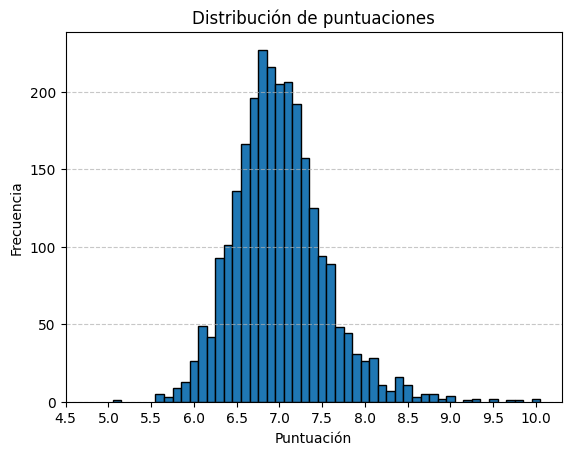

In [311]:
%matplotlib inline
plt.bar(valores, count, width=0.1, label=valores, edgecolor="black")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(np.arange(4.5, 10.5, 0.5))
plt.title("Distribución de puntuaciones")
plt.xlabel("Puntuación")
plt.ylabel("Frecuencia")
plt.show()


Vamos a intentar encerrar en dos líneas verticales el 50% de nuestros datos, pero queremos el 50% de los datos que están mas cerca de la media. Para ello sacaremos el percentil 25 y el percentil 75.
Ya de paso vamos a calcular la mediana, ya que realmente la mediana es el percentil 50.<p>
En un principio había hecho una función que puediese hacer cualquier percentil, pero luego me he dado cuenta que en el apartado "p" es posible usar un array de los percentiles que deseemos calcular. La forma que tenía al principio (cada función hacía un percentil) tiene que ser por fuerza menos optíma que la de ahora, puesto que cada vez que llamemos a la función, se tendrá que llamar a la base de datos y luego realizar los cálculos(que espero que sea *QuickSelect*). Con esta función tan solo llamará a la base de datos 1 vez.

In [312]:
def percentiles_mongo(collection, perc: list) -> float:
    perc = [i/100 for i in perc]
    percentil = collection.aggregate([
    {
        "$group": {
            "_id": None,  
            "percentil": {
                "$percentile": {
                    "input": "$rating",
                    "p": perc, 
                    "method": "approximate"
                    }
                }
            }
        }
    ])
    percentil = list(percentil)
    return percentil[0]["percentil"]
    

In [313]:
lista_percentiles = percentiles_mongo(jugadores_ref, [25, 50, 75])
perc_25, mediana, perc_75 = lista_percentiles


Text(0, 0.5, 'Frecuencia')

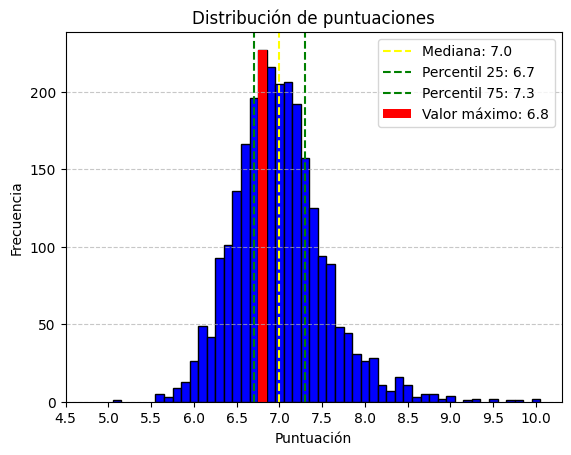

In [314]:
%matplotlib inline
# Al principio cree lo de los colores para hacer que se diferencie la barra con el valor maximo, 
# pero con los problemas que he tenido con la leyenda he decidido dejarlo para si en un futuro 
# aprendo como arreglarlo
max_val_index = np.argmax(count)
max_val = valores[max_val_index]
colores = ["blue" if i!=max_val_index else "red" for i in range(len(count))]

plt.bar(valores, count, color=colores, width=0.1, edgecolor="black")

plt.axvline(mediana, color='yellow', linestyle='--', label=f"Mediana: {mediana}")
plt.axvline(perc_25, color='green', linestyle='--', label=f'Percentil 25: {perc_25}')
plt.axvline(perc_75, color='green', linestyle='--', label=f"Percentil 75: {perc_75}")
plt.bar(max_val, count[max_val_index], width=0.1, color='red', label=f"Valor máximo: {max_val}")  
# Se queda un poco extraña la barra de Valor maximo porque esta superpuesta en la gráfica de barras, 
# ya que así es la única manera que he encontrado de ponerlo en la leyenda
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(np.arange(4.5, 10.5, 0.5))
plt.title("Distribución de puntuaciones")
plt.xlabel("Puntuación")
plt.ylabel("Frecuencia")



Como nos podemos fijar, este gráfico tiende a una distribución normal. Sacaremos la media y la desviación típica para poder tener la función de densidad de probabilidad.
$$
f(x) = \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{1}{2} \left( \frac{x - \mu}{\sigma} \right)^2}
$$
Podriamos usar los datos de "valores" y "count" para sacar $\sigma$ y $\mu$ usando las herramientas proporcionadas en python, pero tiene más gracia hacerlo con MongoDB, ya que es una clase de Bases de datos noSQL.

In [315]:
def distribucion_normal(collection, name_field):
    name_field = "$"+name_field
    resultado = collection.aggregate([
    {
        "$group": {
            "_id": None, 
            "media": {"$avg": name_field}, 
            "desviacion_tipica": {"$stdDevPop": name_field}  
            }
        }
    ])
    resultado = list(resultado)
    return resultado[0]["media"], resultado[0]["desviacion_tipica"]

In [316]:
media, desviacion_tipica = distribucion_normal(jugadores_ref, "rating")
print(f"Media: {media}")
print(f"Desviacion típica: {desviacion_tipica}")

Media: 7.000422914263744
Desviacion típica: 0.5382592354382129


In [317]:
x = np.linspace(4.5, 10.5, 100)

fdp = norm.pdf(x, loc=media, scale=desviacion_tipica)

<function matplotlib.pyplot.show(close=None, block=None)>

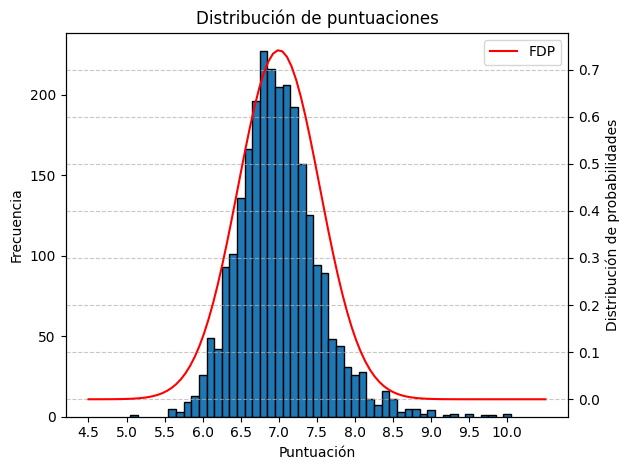

In [318]:
%matplotlib inline
barras = plt.subplot()

barras.bar(valores, count, width=0.1, edgecolor="black")

distribucion = barras.twinx()
distribucion.plot(x, fdp, label="FDP", color="red")


plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(np.arange(4.5, 10.5, 0.5))
plt.title("Distribución de puntuaciones")
barras.set_xlabel("Puntuación")
barras.set_ylabel("Frecuencia")
distribucion.set_ylabel("Distribución de probabilidades")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show

Viendo que en esta gráfica la moda no se ubica en el punto 6.6 podemos sacar algunas posibles conclusiones:
* Es posible que al filtrar por jugadores que hayan participado mas de {{min_minutos}}.
* Puede ser que como 6.6 es la media global existan ligas inferiores (como Segunda RFEF) donde se encuentren peores jugadores.

## Elección de posiciones.

A la hora de crear tu equipo en Fantasy tienes que poner una formación en tu equipo. Hay una amplía gama de formaciones, donde solo puedes colocar un portero, entre 3 y 5 defensas, 3-5 mediocentros y 1-3 delanteros. Como máximo debes tener 11 jugadores y la única posición fija será la de portero, que solo puede tener 1. Vamos a hacer un análisis de cuáles son las posiciones con:
* Puntuaciones mayores a 9.5
* Puntuaciones mayores a 7.0 y menores a 9.5
* Puntuaciones menores a 7.0
<span style="color:cyan">SofaScore</span> Guarda la posición de los jugadores según los siguientes valores:
* "G": Goalkeeper
* "D": Defender
* "M": Midfield
* "F": Forward

In [343]:
def acondicionar_res(resultado):
    posit = dict()
    for doc in resultado:
        posit[doc["_id"]] = (doc["total"])
    return posit


In [344]:
def pie_chart(result, feature, portero, min_val, max_val):

    result = acondicionar_res(result)
    if portero:
        portero = "(sin tener en cuenta a los porteros)"

    if feature=="$position":
        posibles_valores = {"G":0, "D":1, "M":2, "F":3}
        colores_posibles = ['#FFD966', '#6FA8DC', '#93C47D', '#E06666'] # Escogí estos colores de una paleta porque para las posiciones
                                                                        # no creía que fuese interesante colores tan vibrantes
        posibles_labels = ["Portero", "Defensa", "Mediocentro", "Delantero"]
        title = f"Posiciones con puntuaciones entre {min_val} y {max_val}"
    
    elif feature=="$match_result":
        posibles_valores = {"W":0, "D":1, "L":2}
        colores_posibles = ['green', 'yellow', 'red']
        posibles_labels = ["Win", "Draw", "Loose"]
        title = f"Relevancia del resultado del partido en las puntuaciones entre {min_val} y {max_val}"

    total = []
    colors = []
    labels = []
    porcentaje = []
    x = []
    for i in result.items():
        posicion = posibles_valores[i[0]]
        color = colores_posibles[posicion]
        label = posibles_labels[posicion] 
        x_i = [posicion, i[1], color, label]
        x.append(x_i)
    x.sort(key=lambda w: w[0])

    def func(pct, allvals):
        absolute = int(np.round(pct/100.*np.sum(allvals)))
        return f"{absolute:d}\n({pct:.1f}%)"


    suma = sum(list(map(lambda x: x[1], x)))
    for i in x:
        total.append(i[1])
        porcentaje.append(f"{((i[1]/suma)*100)} %")
        colors.append(i[2])
        labels.append(i[3])

    
    plt.pie(total, colors=colors, labels=labels, startangle=90,  wedgeprops=dict(width=0.75), autopct=lambda pct: func(pct, total))
    plt.title(title+portero)
    plt.show()


In [347]:
def rango_puntuaciones(collection, feature, min_val=0, max_val=10, grafica=False, portero=True):
    if feature!="position" and feature!="match_result":
        return "No has seleccionado una feature correcta, solo se puede 'position' o 'match_result'"
    else:
        feature = "$"+feature


    if portero:
        portero = ""
    else:
        portero = "G"


    resultado = collection.aggregate([
        {
        "$match": {
            "rating": {"$gte": min_val, "$lte":max_val},
            "position": {"$ne": portero}
            }
        },
        {
            "$group":{
                "_id":feature,
                "total":{"$sum":1},
            }
        }
    ])
    
    resultado = list(resultado)
    if grafica:
        pie_chart(resultado, feature, portero, min_val, max_val)
    return resultado
    

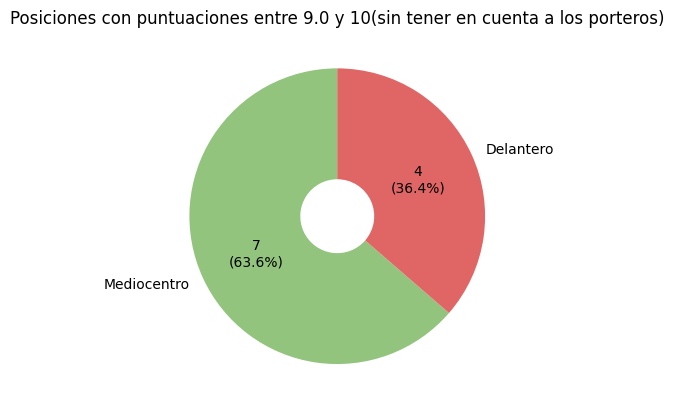

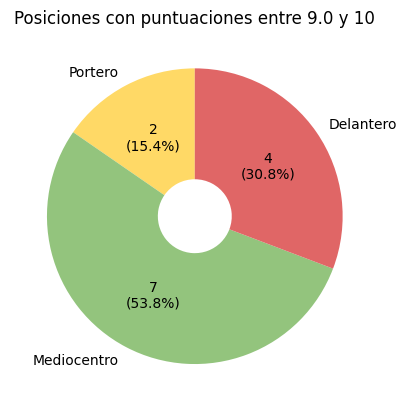

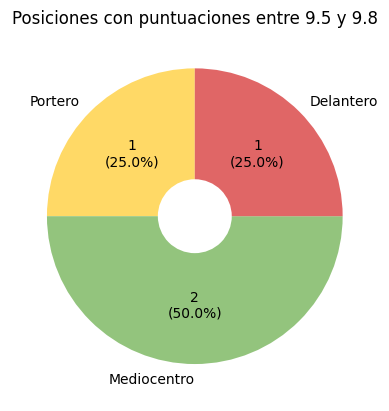

[{'_id': 'M', 'total': 2}, {'_id': 'F', 'total': 1}, {'_id': 'G', 'total': 1}]

In [348]:
rango_puntuaciones(jugadores_ref, "position",  min_val=9.0, grafica=True, portero=False)
rango_puntuaciones(jugadores_ref, "position", min_val=9.0, grafica=True, portero=True)
rango_puntuaciones(jugadores_ref, "position", 9.5, 9.8, grafica=True, )

Por curiosidad, me gustaría saber cuales han sido los mejores jugadores y sus puntuaciones. Al fijarme un poco he notado que a Lamine Yamal le cuentan como MC, pero no estaba seguro si era solo en ese partido o en todos, asi que he hecho tambien un script para ver que posición le dan. Y para mi sorpresa le dan más veces de MC que delantero. Esto es más bien una anécdota, nada importante para el analísis.

In [349]:
resultado = jugadores_ref.find({"rating":{"$gte":9.5}}, {"name":1, "position":1, "rating":1})
for doc in resultado:
    print(doc)

{'_id': ObjectId('675f7cd16efae0aa23fab1b4'), 'position': 'M', 'name': 'lo-celso-giovani', 'rating': 9.7}
{'_id': ObjectId('675f7cd16efae0aa23fab1e4'), 'position': 'F', 'name': 'raphinha', 'rating': 10}
{'_id': ObjectId('675f7cd36efae0aa23fab4c2'), 'position': 'M', 'name': 'lamine-yamal', 'rating': 9.5}
{'_id': ObjectId('675f7cd56efae0aa23faba2f'), 'position': 'G', 'name': 'joan-garcia', 'rating': 9.5}
{'_id': ObjectId('675f7cd66efae0aa23fabbf3'), 'position': 'F', 'name': 'robert-lewandowski', 'rating': 9.8}
{'_id': ObjectId('675f7cd96efae0aa23fac166'), 'position': 'F', 'name': 'vinicius-junior', 'rating': 10}


In [350]:
resultado = jugadores_ref.aggregate([
    {
    "$match": {
        "name": {"$eq": "lamine-yamal"}
        }
    },
    {
        "$group":{
            "_id":"$position",
            "total":{"$sum":1},
        }
    }
])
for doc in resultado:
    print(doc)

{'_id': 'M', 'total': 9}
{'_id': 'F', 'total': 3}
